# Comparación de las tres familias de reconstrucción de la perturbación y sus backgrounds

Este notebook compara exclusivamente los resultados finales de las **segundas corridas**:

- **old ASLS — best 2da**
- **Whittaker — best 2da**
- **PolyF3 — best 2da**

La comparación de la perturbación usa directamente las series de **5 minutos ya guardadas**. No se ejecuta LMP, no se crean workers y no se vuelve a evaluar ningún forward.

La comparación de backgrounds usa únicamente los **17 puntos originales** entre 18:00 y 22:00 UTC:

1. backgrounds separados directamente de los datos;
2. backgrounds físicos reconstruidos por las inversiones de background;
3. diferencias por pares entre las tres familias.

Todos los residuales se definen como:

\[
\mathrm{residual} = \mathrm{modelo} - \mathrm{datos}.
\]

## 1. Paquetes y directorios de salida

In [2]:
using HDF5
using Dates
using Statistics
using Printf
using DataFrames
import CairoMakie as CM

CM.activate!()

OUTDIR = joinpath(pwd(), "comparacion_3familias_best2_perturbacion_y_backgrounds")
FIGDIR = joinpath(OUTDIR, "figures")
TABDIR = joinpath(OUTDIR, "tables")

mkpath(FIGDIR)
mkpath(TABDIR)

println("Directorio de salida:")
println("  ", OUTDIR)

Directorio de salida:
  /home/jp/basefolder_JP/comparacion_3familias_best2_perturbacion_y_backgrounds


## 2. Utilidades generales

In [15]:
function h5exists(path::AbstractString, key::AbstractString)
    isfile(path) || return false
    h5open(path, "r") do f
        return haskey(f, key)
    end
end

function read_any(path::AbstractString, key::AbstractString)
    h5open(path, "r") do f
        return read(f[key])
    end
end

readvec(path::AbstractString, key::AbstractString) = Float64.(vec(read_any(path, key)))

function clean_h5_string(x)
    if x === nothing || x === missing
        return ""
    elseif x isa AbstractString
        return replace(String(x), "\0" => "")
    elseif x isa AbstractArray{UInt8}
        return replace(String(vec(x)), "\0" => "")
    elseif x isa AbstractArray && length(x) == 1
        return clean_h5_string(first(x))
    else
        return replace(string(x), "\0" => "")
    end
end

function read_attr_raw(path::AbstractString, key::AbstractString; default = nothing)
    h5open(path, "r") do f
        attrs = HDF5.attributes(f)
        return haskey(attrs, key) ? read(attrs[key]) : default
    end
end

attr_string(path::AbstractString, key::AbstractString; default = "") =
    clean_h5_string(read_attr_raw(path, key; default = default))

function attr_float(path::AbstractString, key::AbstractString; default = NaN)
    x = read_attr_raw(path, key; default = default)

    if x isa AbstractArray && length(x) == 1
        x = first(x)
    end

    try
        return Float64(x)
    catch
        try
            return parse(Float64, clean_h5_string(x))
        catch
            return default
        end
    end
end

function first_existing_vector(
    path::AbstractString,
    keys::Vector{String};
    required::Bool = true,
)
    for key in keys
        if h5exists(path, key)
            return readvec(path, key), key
        end
    end

    required && error(
        "No encontré ninguna de estas llaves en $(basename(path)):\n" *
        join(keys, "\n"),
    )

    return nothing, ""
end

function read_string_vector(path::AbstractString, key::AbstractString)
    x = read_any(path, key)

    if x isa AbstractArray{<:AbstractString}
        return String.(vec(x))
    elseif x isa AbstractString
        return filter(s -> !isempty(s), strip.(split(String(x), '\n')))
    elseif x isa AbstractArray{UInt8}
        if ndims(x) == 1
            return filter(s -> !isempty(s), strip.(split(clean_h5_string(x), '\n')))
        elseif size(x, 1) <= size(x, 2)
            return [clean_h5_string(x[:, j]) for j in axes(x, 2)]
        else
            return [clean_h5_string(x[i, :]) for i in axes(x, 1)]
        end
    end

    return clean_h5_string.(vec(x))
end

function find_existing_file(
    name_or_path::AbstractString;
    required::Bool = true,
    extra_dirs::Vector{String} = String[],
)
    if isempty(strip(name_or_path))
        required && error("Se recibió una ruta vacía.")
        return ""
    end

    fname = basename(name_or_path)

    candidates = String[
        name_or_path,
        joinpath(pwd(), name_or_path),
        joinpath(pwd(), fname),
        joinpath(pwd(), "series_5min_FIXED_TPK", fname),
        joinpath("/mnt/data", fname),
    ]

    for d in extra_dirs
        isempty(d) || push!(candidates, joinpath(d, fname))
    end

    for path in unique(candidates)
        if isfile(path)
            return abspath(path)
        end
    end

    roots = unique(vcat([pwd(), "/mnt/data"], extra_dirs))
    for root in roots
        isdir(root) || continue

        for (dir, _subdirs, files) in walkdir(root)
            if fname in files
                return abspath(joinpath(dir, fname))
            end
        end
    end

    required && error("No encontré el archivo: $(name_or_path)")
    return ""
end

function resolve_source_file(
    perturbation_h5::AbstractString,
    attr_name::AbstractString,
    fallback_name::AbstractString,
    env_name::AbstractString,
)
    override = strip(get(ENV, env_name, ""))
    if !isempty(override)
        return find_existing_file(
            override;
            extra_dirs = [dirname(abspath(perturbation_h5))],
        )
    end

    stored = strip(attr_string(perturbation_h5, attr_name; default = ""))
    candidate = isempty(stored) ? fallback_name : stored

    if isempty(strip(candidate))
        error(
            "El atributo $(attr_name) está vacío en $(basename(perturbation_h5)) " *
            "y no se definió un fallback. Define ENV[\"$(env_name)\"].",
        )
    end

    return find_existing_file(
        candidate;
        extra_dirs = [dirname(abspath(perturbation_h5))],
    )
end

function write_dataframe_csv(df::DataFrame, path::AbstractString)
    function csv_field(x)
        s = x === missing ? "" : string(x)
        return "\"" * replace(s, "\"" => "\"\"") * "\""
    end

    open(path, "w") do io
        println(io, join(csv_field.(names(df)), ","))
        for row in eachrow(df)
            println(
                io,
                join([csv_field(row[Symbol(name)]) for name in names(df)], ","),
            )
        end
    end

    println("Tabla guardada: ", path)
    return path
end

function normalize_unix(x::AbstractVector)
    u = Float64.(vec(x))
    median(abs.(u)) > 1e12 && (u = u ./ 1000.0)
    return u
end

hour_from_datetime(dt::DateTime) =
    Dates.hour(dt) +
    Dates.minute(dt) / 60 +
    Dates.second(dt) / 3600 +
    Dates.millisecond(dt) / 3.6e6

hour_from_unix(u::AbstractVector) =
    hour_from_datetime.(unix2datetime.(round.(Int, normalize_unix(u))))

function parse_iso_datetime(s::AbstractString)
    ss = strip(String(s))
    ss = replace(ss, "Z" => "")
    ss = replace(ss, r"\+00:00$" => "")
    ss = length(ss) >= 19 ? ss[1:19] : ss
    return DateTime(ss)
end

function time_reference(
    path::AbstractString,
    n::Int;
    fallback_ref_unix = nothing,
)
    unix_keys = [
        "time/timestamps_unix",
        "time/timestamps_unix_used",
        "timestamps",
        "timestamps_unix",
        "time_unix",
        "unix_timestamps",
        "timestamps_unix_used",
        "time_unix_used",
    ]

    for key in unix_keys
        if h5exists(path, key)
            u = normalize_unix(readvec(path, key))
            length(u) == n || continue
            return (
                unix = u,
                hours = hour_from_unix(u),
                source = key,
            )
        end
    end

    iso_keys = [
        "time/timestamps_iso_utc",
        "timestamps_iso",
        "timestamps_iso_utc",
        "time_iso",
        "datetime_iso",
    ]

    for key in iso_keys
        if h5exists(path, key)
            s = read_string_vector(path, key)
            length(s) == n || continue
            u = datetime2unix.(parse_iso_datetime.(s))
            return (
                unix = Float64.(u),
                hours = hour_from_unix(u),
                source = key,
            )
        end
    end

    hour_keys = [
        "time/t_hours",
        "time/t_hours_used",
        "t_hours",
        "t_hours_used",
        "hours",
    ]

    for key in hour_keys
        if h5exists(path, key)
            h = readvec(path, key)
            length(h) == n || continue
            return (
                unix = nothing,
                hours = h,
                source = key,
            )
        end
    end

    if fallback_ref_unix !== nothing && length(fallback_ref_unix) == n
        u = normalize_unix(fallback_ref_unix)
        return (
            unix = u,
            hours = hour_from_unix(u),
            source = "fallback_ref_unix",
        )
    end

    error(
        "No pude reconstruir el eje temporal de $(basename(path)) para N=$(n).",
    )
end

function align_to_reference(
    y::AbstractVector,
    source_time::NamedTuple,
    ref_time::NamedTuple;
    tol_s::Float64 = 1.1,
)
    if source_time.unix !== nothing && ref_time.unix !== nothing
        src = Float64.(source_time.unix)
        ref = Float64.(ref_time.unix)
        tol = tol_s
        unit = "s"
    else
        src = Float64.(source_time.hours)
        ref = Float64.(ref_time.hours)
        tol = tol_s / 3600.0
        unit = "h"
    end

    idx = Vector{Int}(undef, length(ref))
    delta = Vector{Float64}(undef, length(ref))

    for j in eachindex(ref)
        d = abs.(src .- ref[j])
        idx[j] = argmin(d)
        delta[j] = d[idx[j]]
    end

    maximum(delta) <= tol || error(
        "No pude alinear $(length(ref)) puntos. " *
        "Máxima diferencia=$(maximum(delta)) $(unit), tolerancia=$(tol) $(unit). " *
        "Fuente temporal=$(source_time.source).",
    )

    length(unique(idx)) == length(idx) || error(
        "La alineación temporal reutilizó índices de la serie fuente.",
    )

    return Float64.(y[idx]), idx, maximum(delta), unit
end

function chi2_norm(model::AbstractVector, target::AbstractVector)
    den = sum((target .- mean(target)) .^ 2)
    den > 0.0 || error("El target tiene varianza cero.")
    return sum((model .- target) .^ 2) / den
end

rmse(model::AbstractVector, target::AbstractVector) =
    sqrt(mean((model .- target) .^ 2))

rmse_zero(x::AbstractVector) = sqrt(mean(Float64.(x) .^ 2))

function metrics(model_A, model_phi, target_A, target_phi)
    chiA = chi2_norm(model_A, target_A)
    chiP = chi2_norm(model_phi, target_phi)

    return (
        chi2_A = chiA,
        chi2_phi = chiP,
        chi2_total = chiA + chiP,
        RMSE_A_dB = rmse(model_A, target_A),
        RMSE_phi_deg = rmse(model_phi, target_phi),
    )
end

function pairwise_difference_table(
    method_names::Vector{String},
    A_series::Vector,
    phi_series::Vector,
)
    rows = NamedTuple[]

    for (i, j) in [(1, 2), (1, 3), (2, 3)]
        dA = Float64.(A_series[i]) .- Float64.(A_series[j])
        dphi = Float64.(phi_series[i]) .- Float64.(phi_series[j])

        push!(
            rows,
            (
                comparacion = "$(method_names[i]) - $(method_names[j])",
                mean_delta_A_dB = mean(dA),
                rmse_delta_A_dB = rmse_zero(dA),
                maxabs_delta_A_dB = maximum(abs.(dA)),
                mean_delta_phi_deg = mean(dphi),
                rmse_delta_phi_deg = rmse_zero(dphi),
                maxabs_delta_phi_deg = maximum(abs.(dphi)),
            ),
        )
    end

    return DataFrame(rows)
end

METHOD_NAMES = ["ASLS", "Whittaker", "Polynomial"]
METHOD_COLORS = [:dodgerblue3, :darkgreen, :red3]
METHOD_LINESTYLES = [:dashdot, :dot, :solid]
METHOD_MARKERS = [:rect, :diamond, :circle]
PAIR_COLORS = [:purple3, :darkorange2, :teal]
PAIR_LINESTYLES = [:solid, :dash, :dot]

3-element Vector{Symbol}:
 :solid
 :dash
 :dot

## 3. Archivos de entrada

In [16]:
OLD_SECOND_H5_NAME =
    "new-perturbation-inversion_F3_nexp_oldASLS_BG13341497_FIXED_TPK_rel10_seed_from_15341092_results_15373069.h5"

WHIT_SECOND_H5_NAME =
    "new-perturbation-inversion_F3_nexp_whittakerBG12976567_FIXED_TPK_restart_from15517278_rel10_z0wide20_results_15572093.h5"

POLY_SECOND_H5_NAME =
    "new-perturbation-inversion_F3_nexp_polyF3BG15742708_FIXED_TPK_restart_from_15824988_rel10_results_15868514.h5"

OLD_WHIT_5MIN_H5_NAME =
    "series_5min_seed_oldASLSbest_whittakerbest_FIXED_TPK.h5"

POLY_5MIN_H5_NAME =
    "perturbation_polyF3BG15742708_seed_BBO1_15824988_BBO2_15868514_timeseries_5min.h5"

OLD_SEP_H5_FALLBACK = "datos_asls_full-v3.h5"
WHIT_SEP_H5_FALLBACK = "real_whittaker_selected_background_16_22_for_inversion.h5"
POLY_SEP_H5_FALLBACK =
    "simultaneous_polyF3_NAA_V_20080325_window16_22_degA7_degPhi4.h5"

OLD_BG_H5_FALLBACK =
    "new-real-background-inversion-bbo_from_old_asls_restart_results_13341497.h5"

WHIT_BG_H5_FALLBACK =
    "new-real-background-inversion_from_sep_16_22_restart15_results_12976567.h5"

OLD_SECOND_H5 = find_existing_file(
    get(ENV, "OLD_SECOND_H5", OLD_SECOND_H5_NAME),
)

WHIT_SECOND_H5 = find_existing_file(
    get(ENV, "WHIT_SECOND_H5", WHIT_SECOND_H5_NAME),
)

POLY_SECOND_H5 = find_existing_file(
    get(ENV, "POLY_SECOND_H5", POLY_SECOND_H5_NAME),
)

OLD_WHIT_5MIN_H5 = find_existing_file(
    get(ENV, "OLD_WHIT_5MIN_H5", OLD_WHIT_5MIN_H5_NAME),
)

POLY_5MIN_H5 = find_existing_file(
    get(ENV, "POLY_5MIN_H5", POLY_5MIN_H5_NAME),
)

OLD_SEP_H5 = resolve_source_file(
    OLD_SECOND_H5,
    "separation_source_h5",
    OLD_SEP_H5_FALLBACK,
    "OLD_SEP_H5",
)

WHIT_SEP_H5 = resolve_source_file(
    WHIT_SECOND_H5,
    "separation_source_h5",
    WHIT_SEP_H5_FALLBACK,
    "WHIT_SEP_H5",
)

POLY_SEP_H5 = resolve_source_file(
    POLY_SECOND_H5,
    "separation_source_h5",
    POLY_SEP_H5_FALLBACK,
    "POLY_SEP_H5",
)

OLD_BG_H5 = resolve_source_file(
    OLD_SECOND_H5,
    "background_source_h5",
    OLD_BG_H5_FALLBACK,
    "OLD_BG_H5",
)

WHIT_BG_H5 = resolve_source_file(
    WHIT_SECOND_H5,
    "background_source_h5",
    WHIT_BG_H5_FALLBACK,
    "WHIT_BG_H5",
)

POLY_BG_H5 = resolve_source_file(
    POLY_SECOND_H5,
    "background_source_h5",
    "",
    "POLY_BG_H5",
)

input_paths = DataFrame(
    item = [
        "OLD_SECOND_H5",
        "WHIT_SECOND_H5",
        "POLY_SECOND_H5",
        "OLD_WHIT_5MIN_H5",
        "POLY_5MIN_H5",
        "OLD_SEP_H5",
        "WHIT_SEP_H5",
        "POLY_SEP_H5",
        "OLD_BG_H5",
        "WHIT_BG_H5",
        "POLY_BG_H5",
    ],
    path = [
        OLD_SECOND_H5,
        WHIT_SECOND_H5,
        POLY_SECOND_H5,
        OLD_WHIT_5MIN_H5,
        POLY_5MIN_H5,
        OLD_SEP_H5,
        WHIT_SEP_H5,
        POLY_SEP_H5,
        OLD_BG_H5,
        WHIT_BG_H5,
        POLY_BG_H5,
    ],
)

display(input_paths)
write_dataframe_csv(input_paths, joinpath(TABDIR, "archivos_de_entrada.csv"))

Row,item,path
,String,String
1,OLD_SECOND_H5,/home/jp/basefolder_JP/new-perturbation-inversion_F3_nexp_oldASLS_BG13341497_FIXED_TPK_rel10_seed_from_15341092_results_15373069.h5
2,WHIT_SECOND_H5,/home/jp/basefolder_JP/new-perturbation-inversion_F3_nexp_whittakerBG12976567_FIXED_TPK_restart_from15517278_rel10_z0wide20_results_15572093.h5
3,POLY_SECOND_H5,/home/jp/basefolder_JP/new-perturbation-inversion_F3_nexp_polyF3BG15742708_FIXED_TPK_restart_from_15824988_rel10_results_15868514.h5
4,OLD_WHIT_5MIN_H5,/home/jp/basefolder_JP/series_5min_FIXED_TPK/series_5min_seed_oldASLSbest_whittakerbest_FIXED_TPK.h5
5,POLY_5MIN_H5,/home/jp/basefolder_JP/perturbation_polyF3BG15742708_seed_BBO1_15824988_BBO2_15868514_timeseries_5min.h5
6,OLD_SEP_H5,/home/jp/basefolder_JP/datos_asls_full-v3.h5
7,WHIT_SEP_H5,/home/jp/basefolder_JP/real_whittaker_selected_background_16_22_for_inversion.h5
8,POLY_SEP_H5,/home/jp/basefolder_JP/outputs_simultaneous_polyF3_window_degree_NAA_PLO_20080325/h5/simultaneous_polyF3_NAA_V_20080325_window16_22_degA7_degPhi4.h5
9,OLD_BG_H5,/home/jp/basefolder_JP/new-real-background-inversion-bbo_from_old_asls_restart_results_13341497.h5


Tabla guardada: /home/jp/basefolder_JP/comparacion_3familias_best2_perturbacion_y_backgrounds/tables/archivos_de_entrada.csv


"/home/jp/basefolder_JP/comparacion_3familias_best2_perturbacion_y_backgrounds/tables/archivos_de_entrada.csv"

## 4. Comparación de las perturbaciones a 5 minutos

Se cargan únicamente las reconstrucciones **best de las segundas corridas**.  
El target común es el conjunto de datos reales corregidos guardado en el HDF5 PolyF3 de 5 minutos.

In [17]:
poly_timestamps_5min = normalize_unix(
    readvec(POLY_5MIN_H5, "time/timestamps_unix"),
)

poly_time_5min = (
    unix = poly_timestamps_5min,
    hours = hour_from_unix(poly_timestamps_5min),
    source = "time/timestamps_unix",
)

A_data_5min = readvec(POLY_5MIN_H5, "target/A_dB")
phi_data_5min = readvec(POLY_5MIN_H5, "target/phi_deg")

A_poly_best2_5min = readvec(POLY_5MIN_H5, "models/best2/A_dB")
phi_poly_best2_5min = readvec(POLY_5MIN_H5, "models/best2/phi_deg")

old_whit_timestamps_5min = normalize_unix(
    readvec(OLD_WHIT_5MIN_H5, "time/timestamps_unix"),
)

old_whit_time_5min = (
    unix = old_whit_timestamps_5min,
    hours = hour_from_unix(old_whit_timestamps_5min),
    source = "time/timestamps_unix",
)

A_old_raw_5min = readvec(OLD_WHIT_5MIN_H5, "oldASLS_best2/A_model")
phi_old_raw_5min = readvec(OLD_WHIT_5MIN_H5, "oldASLS_best2/phi_model")

A_whit_raw_5min = readvec(OLD_WHIT_5MIN_H5, "whittaker_best2/A_model")
phi_whit_raw_5min = readvec(OLD_WHIT_5MIN_H5, "whittaker_best2/phi_model")

A_old_best2_5min, _, max_dt_old_A, unit_old_A = align_to_reference(
    A_old_raw_5min,
    old_whit_time_5min,
    poly_time_5min,
)

phi_old_best2_5min, _, max_dt_old_phi, unit_old_phi = align_to_reference(
    phi_old_raw_5min,
    old_whit_time_5min,
    poly_time_5min,
)

A_whit_best2_5min, _, max_dt_whit_A, unit_whit_A = align_to_reference(
    A_whit_raw_5min,
    old_whit_time_5min,
    poly_time_5min,
)

phi_whit_best2_5min, _, max_dt_whit_phi, unit_whit_phi = align_to_reference(
    phi_whit_raw_5min,
    old_whit_time_5min,
    poly_time_5min,
)

n5 = length(poly_timestamps_5min)

@assert n5 == 49
@assert all(
    length(v) == n5 for v in [
        A_data_5min,
        phi_data_5min,
        A_old_best2_5min,
        phi_old_best2_5min,
        A_whit_best2_5min,
        phi_whit_best2_5min,
        A_poly_best2_5min,
        phi_poly_best2_5min,
    ]
)

println("Grilla común de perturbación:")
println("  N = ", n5)
println(
    "  UTC = ",
    first(poly_time_5min.hours),
    " → ",
    last(poly_time_5min.hours),
    " h",
)
println(
    "  máxima diferencia temporal old/Whittaker vs Poly = ",
    maximum([
        max_dt_old_A,
        max_dt_old_phi,
        max_dt_whit_A,
        max_dt_whit_phi,
    ]),
    " ",
    unit_old_A,
)

A_models_5min = [
    A_old_best2_5min,
    A_whit_best2_5min,
    A_poly_best2_5min,
]

phi_models_5min = [
    phi_old_best2_5min,
    phi_whit_best2_5min,
    phi_poly_best2_5min,
]

metrics_5min_rows = NamedTuple[]

for i in eachindex(METHOD_NAMES)
    m = metrics(
        A_models_5min[i],
        phi_models_5min[i],
        A_data_5min,
        phi_data_5min,
    )

    push!(
        metrics_5min_rows,
        (
            metodo = METHOD_NAMES[i] * " — best 2nd",
            chi2_A = m.chi2_A,
            chi2_phi = m.chi2_phi,
            chi2_total = m.chi2_total,
            RMSE_A_dB = m.RMSE_A_dB,
            RMSE_phi_deg = m.RMSE_phi_deg,
        ),
    )
end

metrics_perturbation_5min = DataFrame(metrics_5min_rows)

display(metrics_perturbation_5min)
write_dataframe_csv(
    metrics_perturbation_5min,
    joinpath(TABDIR, "metricas_perturbacion_best2_5min.csv"),
)

labels_A_5min = [
    @sprintf(
        "%s (χ²_A=%.4f, χ²_ϕ=%.4f, χ²_total=%.4f, RMSE_A=%.4f dB)",
        metrics_perturbation_5min.metodo[i],
        metrics_perturbation_5min.chi2_A[i],
        metrics_perturbation_5min.chi2_phi[i],
        metrics_perturbation_5min.chi2_total[i],
        metrics_perturbation_5min.RMSE_A_dB[i],
    )
    for i in 1:nrow(metrics_perturbation_5min)
]

labels_phi_5min = [
    @sprintf(
        "%s (χ²_A=%.4f, χ²_ϕ=%.4f, χ²_total=%.4f, RMSE_ϕ=%.4f°)",
        metrics_perturbation_5min.metodo[i],
        metrics_perturbation_5min.chi2_A[i],
        metrics_perturbation_5min.chi2_phi[i],
        metrics_perturbation_5min.chi2_total[i],
        metrics_perturbation_5min.RMSE_phi_deg[i],
    )
    for i in 1:nrow(metrics_perturbation_5min)
]

Grilla común de perturbación:
  N = 49
  UTC = 18.0 → 22.0 h
  máxima diferencia temporal old/Whittaker vs Poly = 0.0 s


Row,metodo,chi2_A,chi2_phi,chi2_total,RMSE_A_dB,RMSE_phi_deg
,String,Float64,Float64,Float64,Float64,Float64
1,ASLS — best 2da,0.0692188,0.236312,0.30553,0.622537,17.297
2,Whittaker — best 2da,0.167012,0.114903,0.281915,0.967001,12.0613
3,Polynomial — best 2da,0.0972514,0.0889919,0.186243,0.737906,10.6146


Tabla guardada: /home/jp/basefolder_JP/comparacion_3familias_best2_perturbacion_y_backgrounds/tables/metricas_perturbacion_best2_5min.csv


3-element Vector{String}:
 "ASLS — best 2da (χ²_A=0.0692, χ²_ϕ=0.2363, χ²_total=0.3055, RMSE_ϕ=17.2970°)"
 "Whittaker — best 2da (χ²_A=0.16" ⋯ 24 bytes ⋯ "_total=0.2819, RMSE_ϕ=12.0613°)"
 "Polynomial — best 2da (χ²_A=0.0" ⋯ 25 bytes ⋯ "_total=0.1862, RMSE_ϕ=10.6146°)"

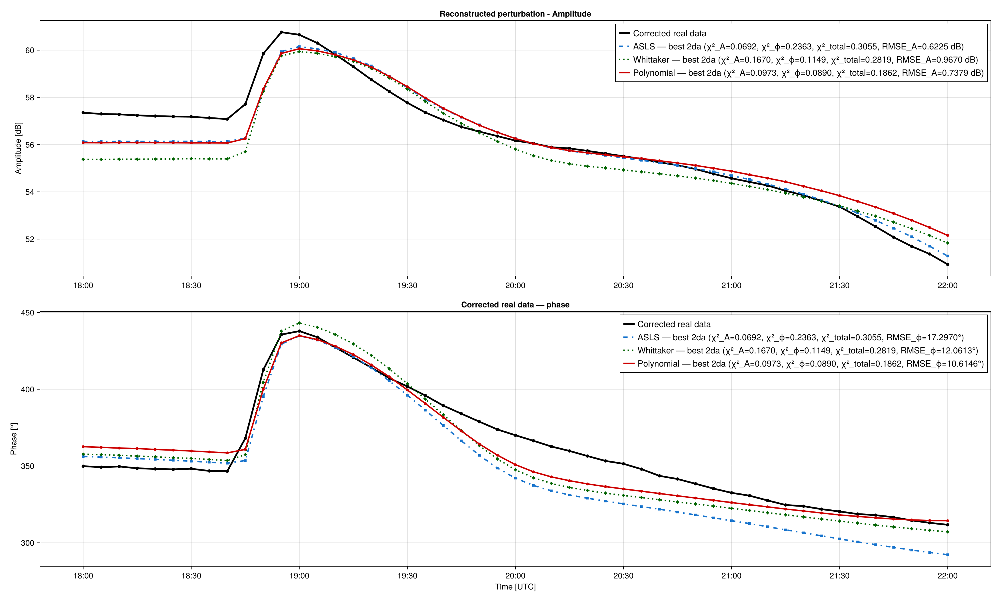

CairoMakie.Screen{IMAGE}


In [18]:
fontsize = 15
ticks_5min = collect(18.0:0.5:22.0)
tick_dt_5min = collect(
    DateTime(2008, 3, 25, 18, 0, 0):
    Minute(30):
    DateTime(2008, 3, 25, 22, 0, 0),
)

xticks_5min = (
    ticks_5min,
    Dates.format.(tick_dt_5min, "HH:MM"),
)

t_pk_hour = 19.0
t_pk_label = "t_pk = 19:00 UTC"

fig_perturbation_series = CM.Figure(size = (1750, 1050))

axA_perturbation = CM.Axis(
    fig_perturbation_series[1, 1],
    title = "Reconstructed perturbation - Amplitude",
    ylabel = "Amplitude [dB]",
    xticks = xticks_5min,
)

CM.lines!(
    axA_perturbation,
    poly_time_5min.hours,
    A_data_5min,
    color = :black,
    linewidth = 3,
    label = "Corrected real data",
)
CM.scatter!(
    axA_perturbation,
    poly_time_5min.hours,
    A_data_5min,
    color = :black,
    markersize = 8,
)

for i in eachindex(METHOD_NAMES)
    CM.lines!(
        axA_perturbation,
        poly_time_5min.hours,
        A_models_5min[i],
        color = METHOD_COLORS[i],
        linestyle = METHOD_LINESTYLES[i],
        linewidth = 2.5,
        label = labels_A_5min[i],
    )
    CM.scatter!(
        axA_perturbation,
        poly_time_5min.hours,
        A_models_5min[i],
        color = METHOD_COLORS[i],
        marker = METHOD_MARKERS[i],
        markersize = 7,
    )
end

#=
CM.vlines!(
    axA_perturbation,
    [t_pk_hour],
    color = :darkorange2,
    linestyle = :dash,
    linewidth = 2,
    label = t_pk_label,
)
=#
CM.axislegend(
    axA_perturbation,
    position = :rt,
    labelsize = fontsize,
)

axPhi_perturbation = CM.Axis(
    fig_perturbation_series[2, 1],
    title = "Corrected real data — phase",
    xlabel = "Time [UTC]",
    ylabel = "Phase [°]",
    xticks = xticks_5min,
)

CM.lines!(
    axPhi_perturbation,
    poly_time_5min.hours,
    phi_data_5min,
    color = :black,
    linewidth = 3,
    label = "Corrected real data",
)
CM.scatter!(
    axPhi_perturbation,
    poly_time_5min.hours,
    phi_data_5min,
    color = :black,
    markersize = 8,
)

for i in eachindex(METHOD_NAMES)
    CM.lines!(
        axPhi_perturbation,
        poly_time_5min.hours,
        phi_models_5min[i],
        color = METHOD_COLORS[i],
        linestyle = METHOD_LINESTYLES[i],
        linewidth = 2.5,
        label = labels_phi_5min[i],
    )
    CM.scatter!(
        axPhi_perturbation,
        poly_time_5min.hours,
        phi_models_5min[i],
        color = METHOD_COLORS[i],
        marker = METHOD_MARKERS[i],
        markersize = 7,
    )
end

#=
CM.vlines!(
    axPhi_perturbation,
    [t_pk_hour],
    color = :darkorange2,
    linestyle = :dash,
    linewidth = 2,
    label = t_pk_label,
)
=#
CM.axislegend(
    axPhi_perturbation,
    position = :rt,
    labelsize = fontsize,
)

CM.linkxaxes!(axA_perturbation, axPhi_perturbation)
CM.xlims!(axA_perturbation, 18.0, 22.0)

CM.save(
    joinpath(FIGDIR, "perturbacion_best2_3familias_series_5min.png"),
    fig_perturbation_series,
)

display(fig_perturbation_series)

### Next plot: "reconstructed_perturbacion_3families_series_5min.pdf" (Figure 9)

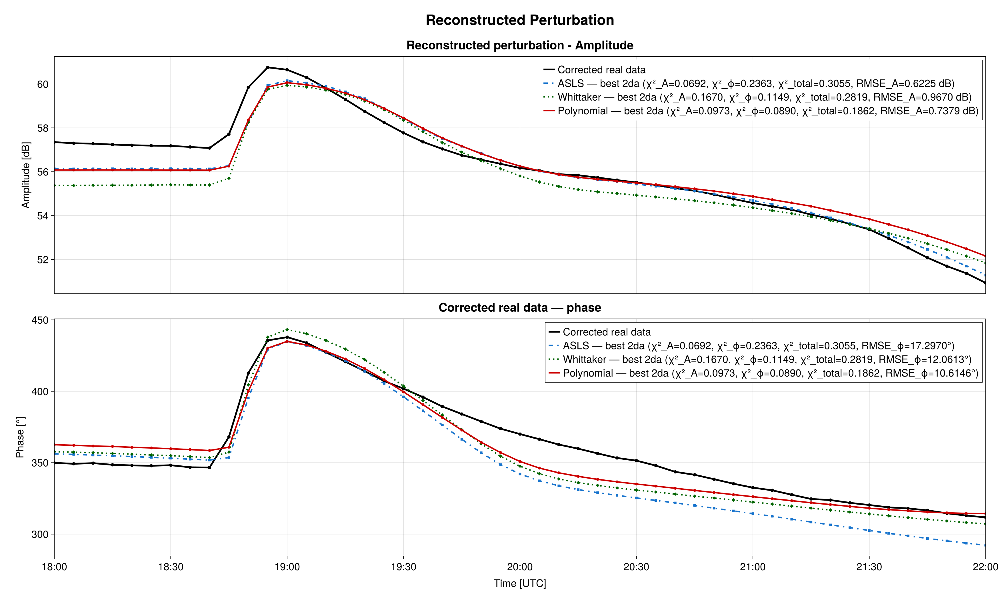

CairoMakie.Screen{IMAGE}


In [39]:
fontsize = 18

xlim_perturbation = (18.0, 22.0)

ticks_5min = collect(18.0:0.5:22.0)

tick_dt_5min = collect(
    DateTime(2008, 3, 25, 18, 0, 0):
    Minute(30):
    DateTime(2008, 3, 25, 22, 0, 0),
)

xticks_5min = (
    ticks_5min,
    Dates.format.(tick_dt_5min, "HH:MM"),
)

t_pk_hour = 19.0
t_pk_label = "t_pk = 19:00 UTC"

fig_perturbation_series = CM.Figure(
    size = (1750, 1050),
    figure_padding = (25, 25, 20, 20),
)

CM.Label(
    fig_perturbation_series[0, 1],
    "Reconstructed Perturbation",
    fontsize = fontsize + 7,
    font = :bold,
    tellwidth = false,
    padding = (0, 0, 5, 0),
)

axA_perturbation = CM.Axis(
    fig_perturbation_series[1, 1],
    title = "Reconstructed perturbation - Amplitude",
    ylabel = "Amplitude [dB]",
    xticks = xticks_5min,
    limits = (xlim_perturbation, nothing),

    titlesize = fontsize + 3,
    titlefont = :bold,
    ylabelsize = fontsize,
    xticklabelsize = fontsize,
    yticklabelsize = fontsize,

    titlegap = 8,
    ylabelpadding = 10,

    xticksvisible = false,
    xticklabelsvisible = false,
)

CM.lines!(
    axA_perturbation,
    poly_time_5min.hours,
    A_data_5min,
    color = :black,
    linewidth = 3,
    label = "Corrected real data",
)

CM.scatter!(
    axA_perturbation,
    poly_time_5min.hours,
    A_data_5min,
    color = :black,
    markersize = 8,
)

for i in eachindex(METHOD_NAMES)
    CM.lines!(
        axA_perturbation,
        poly_time_5min.hours,
        A_models_5min[i],
        color = METHOD_COLORS[i],
        linestyle = METHOD_LINESTYLES[i],
        linewidth = 2.5,
        label = labels_A_5min[i],
    )

    CM.scatter!(
        axA_perturbation,
        poly_time_5min.hours,
        A_models_5min[i],
        color = METHOD_COLORS[i],
        marker = METHOD_MARKERS[i],
        markersize = 7,
    )
end

#=
CM.vlines!(
    axA_perturbation,
    [t_pk_hour],
    color = :darkorange2,
    linestyle = :dash,
    linewidth = 2,
    label = t_pk_label,
)
=#

CM.axislegend(
    axA_perturbation,
    position = :rt,
    labelsize = fontsize,
    framevisible = true,
)

axPhi_perturbation = CM.Axis(
    fig_perturbation_series[2, 1],
    title = "Corrected real data — phase",
    xlabel = "Time [UTC]",
    ylabel = "Phase [°]",
    xticks = xticks_5min,
    limits = (xlim_perturbation, nothing),

    titlesize = fontsize + 3,
    titlefont = :bold,
    xlabelsize = fontsize,
    ylabelsize = fontsize,
    xticklabelsize = fontsize,
    yticklabelsize = fontsize,

    titlegap = 8,
    xlabelpadding = 8,
    ylabelpadding = 10,
)

CM.lines!(
    axPhi_perturbation,
    poly_time_5min.hours,
    phi_data_5min,
    color = :black,
    linewidth = 3,
    label = "Corrected real data",
)

CM.scatter!(
    axPhi_perturbation,
    poly_time_5min.hours,
    phi_data_5min,
    color = :black,
    markersize = 8,
)

for i in eachindex(METHOD_NAMES)
    CM.lines!(
        axPhi_perturbation,
        poly_time_5min.hours,
        phi_models_5min[i],
        color = METHOD_COLORS[i],
        linestyle = METHOD_LINESTYLES[i],
        linewidth = 2.5,
        label = labels_phi_5min[i],
    )

    CM.scatter!(
        axPhi_perturbation,
        poly_time_5min.hours,
        phi_models_5min[i],
        color = METHOD_COLORS[i],
        marker = METHOD_MARKERS[i],
        markersize = 7,
    )
end

#=
CM.vlines!(
    axPhi_perturbation,
    [t_pk_hour],
    color = :darkorange2,
    linestyle = :dash,
    linewidth = 2,
    label = t_pk_label,
)
=#

CM.axislegend(
    axPhi_perturbation,
    position = :rt,
    labelsize = fontsize,
    framevisible = true,
)

CM.linkxaxes!(
    axA_perturbation,
    axPhi_perturbation,
)

CM.xlims!(
    axA_perturbation,
    xlim_perturbation...,
)

CM.xlims!(
    axPhi_perturbation,
    xlim_perturbation...,
)

CM.rowgap!(
    fig_perturbation_series.layout,
    12,
)

CM.save(
    joinpath(
        FIGDIR,
        "perturbacion_best2_3familias_series_5min.pdf",
    ),
    fig_perturbation_series,
)

display(fig_perturbation_series)

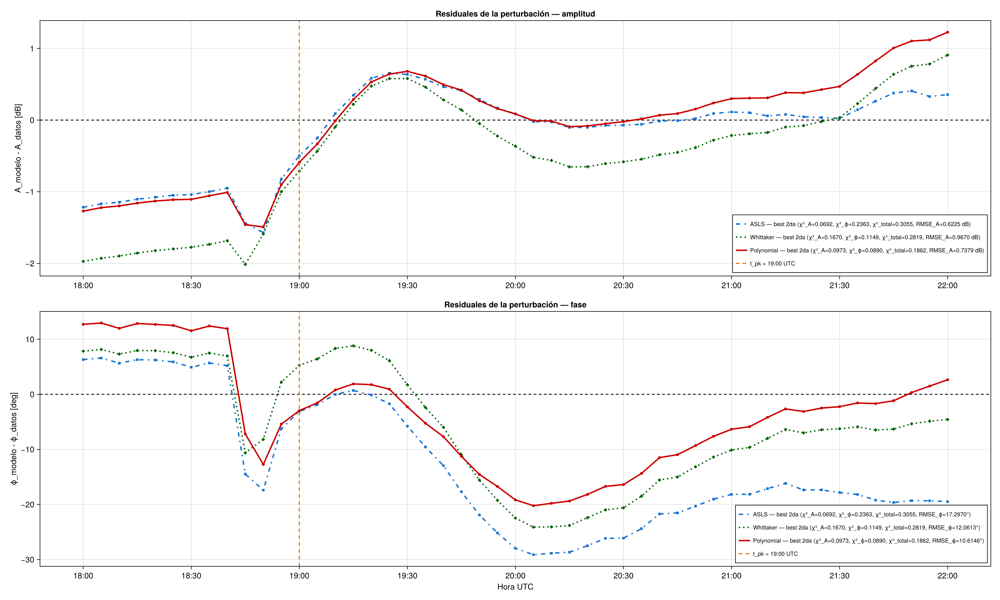

CairoMakie.Screen{IMAGE}


In [20]:
res_A_models_5min = [
    A_models_5min[i] .- A_data_5min
    for i in eachindex(METHOD_NAMES)
]

res_phi_models_5min = [
    phi_models_5min[i] .- phi_data_5min
    for i in eachindex(METHOD_NAMES)
]

fig_perturbation_residuals = CM.Figure(size = (1750, 1050))

axRA_perturbation = CM.Axis(
    fig_perturbation_residuals[1, 1],
    title = "Residuales de la perturbación — amplitud",
    ylabel = "A_modelo - A_datos [dB]",
    xticks = xticks_5min,
)

CM.hlines!(
    axRA_perturbation,
    [0.0],
    color = :black,
    linestyle = :dash,
    linewidth = 1.5,
)

for i in eachindex(METHOD_NAMES)
    CM.lines!(
        axRA_perturbation,
        poly_time_5min.hours,
        res_A_models_5min[i],
        color = METHOD_COLORS[i],
        linestyle = METHOD_LINESTYLES[i],
        linewidth = 2.5,
        label = labels_A_5min[i],
    )
    CM.scatter!(
        axRA_perturbation,
        poly_time_5min.hours,
        res_A_models_5min[i],
        color = METHOD_COLORS[i],
        marker = METHOD_MARKERS[i],
        markersize = 7,
    )
end

CM.vlines!(
    axRA_perturbation,
    [t_pk_hour],
    color = :darkorange2,
    linestyle = :dash,
    linewidth = 2,
    label = t_pk_label,
)

CM.axislegend(
    axRA_perturbation,
    position = :rb,
    labelsize = 10,
)

axRPhi_perturbation = CM.Axis(
    fig_perturbation_residuals[2, 1],
    title = "Residuales de la perturbación — fase",
    xlabel = "Hora UTC",
    ylabel = "ϕ_modelo - ϕ_datos [deg]",
    xticks = xticks_5min,
)

CM.hlines!(
    axRPhi_perturbation,
    [0.0],
    color = :black,
    linestyle = :dash,
    linewidth = 1.5,
)

for i in eachindex(METHOD_NAMES)
    CM.lines!(
        axRPhi_perturbation,
        poly_time_5min.hours,
        res_phi_models_5min[i],
        color = METHOD_COLORS[i],
        linestyle = METHOD_LINESTYLES[i],
        linewidth = 2.5,
        label = labels_phi_5min[i],
    )
    CM.scatter!(
        axRPhi_perturbation,
        poly_time_5min.hours,
        res_phi_models_5min[i],
        color = METHOD_COLORS[i],
        marker = METHOD_MARKERS[i],
        markersize = 7,
    )
end

CM.vlines!(
    axRPhi_perturbation,
    [t_pk_hour],
    color = :darkorange2,
    linestyle = :dash,
    linewidth = 2,
    label = t_pk_label,
)

CM.axislegend(
    axRPhi_perturbation,
    position = :rb,
    labelsize = 10,
)

CM.linkxaxes!(axRA_perturbation, axRPhi_perturbation)
CM.xlims!(axRA_perturbation, 18.0, 22.0)

CM.save(
    joinpath(FIGDIR, "perturbacion_best2_3familias_residuales_5min.png"),
    fig_perturbation_residuals,
)

display(fig_perturbation_residuals)

Row,comparacion,mean_delta_A_dB,rmse_delta_A_dB,maxabs_delta_A_dB,mean_delta_phi_deg,rmse_delta_phi_deg,maxabs_delta_phi_deg
,String,Float64,Float64,Float64,Float64,Float64,Float64
1,ASLS - Whittaker,0.303217,0.446943,0.75997,-7.05423,7.92598,14.9182
2,ASLS - Polynomial,-0.122265,0.273363,0.870691,-9.02086,10.498,22.1269
3,Whittaker - Polynomial,-0.425482,0.472025,0.706842,-1.96663,4.80807,8.22951


Tabla guardada: /home/jp/basefolder_JP/comparacion_3familias_best2_perturbacion_y_backgrounds/tables/diferencias_pares_perturbacion_best2_5min.csv


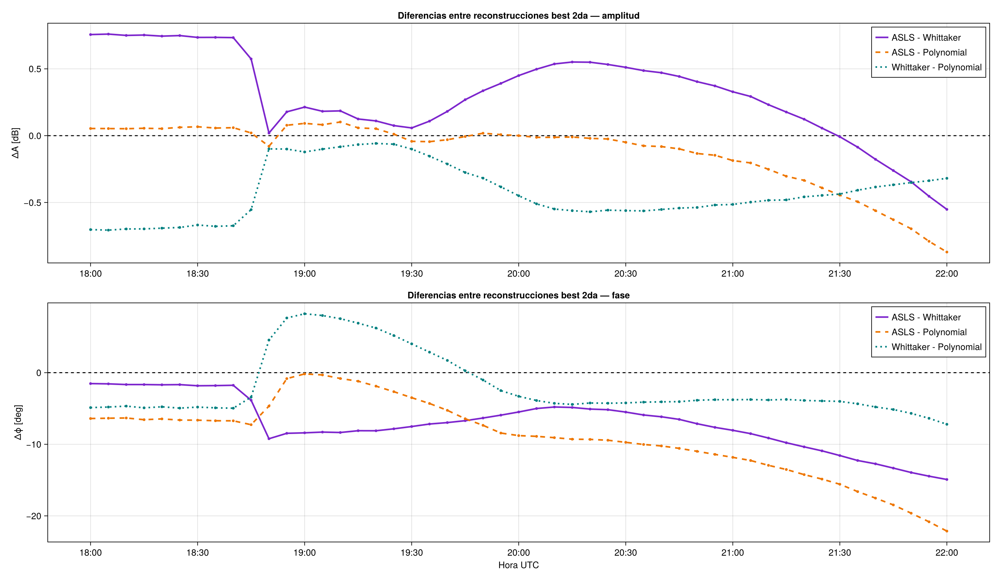

CairoMakie.Screen{IMAGE}


In [21]:
perturbation_pairwise = pairwise_difference_table(
    METHOD_NAMES,
    A_models_5min,
    phi_models_5min,
)

display(perturbation_pairwise)
write_dataframe_csv(
    perturbation_pairwise,
    joinpath(TABDIR, "diferencias_pares_perturbacion_best2_5min.csv"),
)

pair_indices = [(1, 2), (1, 3), (2, 3)]
pair_labels = [
    "$(METHOD_NAMES[i]) - $(METHOD_NAMES[j])"
    for (i, j) in pair_indices
]

fig_perturbation_pairwise = CM.Figure(size = (1550, 900))

axDA_perturbation = CM.Axis(
    fig_perturbation_pairwise[1, 1],
    title = "Diferencias entre reconstrucciones best 2da — amplitud",
    ylabel = "ΔA [dB]",
    xticks = xticks_5min,
)

CM.hlines!(
    axDA_perturbation,
    [0.0],
    color = :black,
    linestyle = :dash,
)

for k in eachindex(pair_indices)
    i, j = pair_indices[k]
    dA = A_models_5min[i] .- A_models_5min[j]

    CM.lines!(
        axDA_perturbation,
        poly_time_5min.hours,
        dA,
        color = PAIR_COLORS[k],
        linestyle = PAIR_LINESTYLES[k],
        linewidth = 2.5,
        label = pair_labels[k],
    )
    CM.scatter!(
        axDA_perturbation,
        poly_time_5min.hours,
        dA,
        color = PAIR_COLORS[k],
        markersize = 6,
    )
end

CM.axislegend(axDA_perturbation, position = :rt)

axDPhi_perturbation = CM.Axis(
    fig_perturbation_pairwise[2, 1],
    title = "Diferencias entre reconstrucciones best 2da — fase",
    xlabel = "Hora UTC",
    ylabel = "Δϕ [deg]",
    xticks = xticks_5min,
)

CM.hlines!(
    axDPhi_perturbation,
    [0.0],
    color = :black,
    linestyle = :dash,
)

for k in eachindex(pair_indices)
    i, j = pair_indices[k]
    dphi = phi_models_5min[i] .- phi_models_5min[j]

    CM.lines!(
        axDPhi_perturbation,
        poly_time_5min.hours,
        dphi,
        color = PAIR_COLORS[k],
        linestyle = PAIR_LINESTYLES[k],
        linewidth = 2.5,
        label = pair_labels[k],
    )
    CM.scatter!(
        axDPhi_perturbation,
        poly_time_5min.hours,
        dphi,
        color = PAIR_COLORS[k],
        markersize = 6,
    )
end

CM.axislegend(axDPhi_perturbation, position = :rt)
CM.linkxaxes!(axDA_perturbation, axDPhi_perturbation)
CM.xlims!(axDA_perturbation, 18.0, 22.0)

CM.save(
    joinpath(FIGDIR, "perturbacion_best2_diferencias_pares_5min.png"),
    fig_perturbation_pairwise,
)

display(fig_perturbation_pairwise)

## 5. Targets y referencia temporal de 17 puntos

Para comparar los backgrounds se usan exclusivamente los 17 timestamps de las segundas corridas.  
Antes de cargar los backgrounds se audita que los tres targets corregidos estén alineados.

In [22]:
function load_second_run_target(
    path::AbstractString;
    label::AbstractString,
    amp_offset::Float64 = 19.0,
    phi_offset::Float64 = -210.0,
)
    if h5exists(path, "targets/target_A_corr") &&
       h5exists(path, "targets/target_phi_corr")
        A = readvec(path, "targets/target_A_corr")
        phi = readvec(path, "targets/target_phi_corr")
        source = "targets/target_*_corr"
    elseif h5exists(path, "target_A_corr") &&
           h5exists(path, "target_phi_corr")
        A = readvec(path, "target_A_corr")
        phi = readvec(path, "target_phi_corr")
        source = "target_*_corr"
    elseif h5exists(path, "target_A") &&
           h5exists(path, "target_phi")
        A = readvec(path, "target_A") .+ amp_offset
        phi = readvec(path, "target_phi") .+ phi_offset
        source = "target_* + offsets"
    elseif h5exists(path, "targets/target_A_raw") &&
           h5exists(path, "targets/target_phi_raw")
        A = readvec(path, "targets/target_A_raw") .+ amp_offset
        phi = readvec(path, "targets/target_phi_raw") .+ phi_offset
        source = "targets/target_*_raw + offsets"
    else
        error("No encontré targets reconocidos en $(basename(path)).")
    end

    length(A) == length(phi) || error(
        "Los targets A y ϕ tienen longitudes distintas en $(basename(path)).",
    )

    tref = time_reference(path, length(A))

    full_params, params_key = first_existing_vector(
        path,
        [
            "reconstruction/full_params",
            "reconstruction/params",
            "reco_params",
        ];
        required = false,
    )

    t_pk_fixed_s = attr_float(path, "t_pk_fixed_s"; default = NaN)

    if !isfinite(t_pk_fixed_s) && h5exists(path, "fixed/t_pk_s")
        t_pk_fixed_s = first(readvec(path, "fixed/t_pk_s"))
    elseif !isfinite(t_pk_fixed_s) &&
           full_params !== nothing &&
           length(full_params) >= 2
        t_pk_fixed_s = full_params[2]
    end

    return (
        label = label,
        path = path,
        A = A,
        phi = phi,
        time = tref,
        target_source = source,
        full_params = full_params,
        params_key = params_key,
        t_pk_fixed_s = t_pk_fixed_s,
        t_pk_fixed_utc = attr_string(path, "t_pk_fixed_utc"; default = ""),
    )
end

target_old_17_raw = load_second_run_target(
    OLD_SECOND_H5;
    label = "old ASLS",
)

target_whit_17_raw = load_second_run_target(
    WHIT_SECOND_H5;
    label = "Whittaker",
)

target_poly_17_raw = load_second_run_target(
    POLY_SECOND_H5;
    label = "PolyF3",
)

REF17 = target_poly_17_raw.time
t_hours_17 = REF17.hours

A_target_old_17, _, dt_target_old_A, unit_target_old_A =
    align_to_reference(target_old_17_raw.A, target_old_17_raw.time, REF17)

phi_target_old_17, _, dt_target_old_phi, unit_target_old_phi =
    align_to_reference(target_old_17_raw.phi, target_old_17_raw.time, REF17)

A_target_whit_17, _, dt_target_whit_A, unit_target_whit_A =
    align_to_reference(target_whit_17_raw.A, target_whit_17_raw.time, REF17)

phi_target_whit_17, _, dt_target_whit_phi, unit_target_whit_phi =
    align_to_reference(target_whit_17_raw.phi, target_whit_17_raw.time, REF17)

A_target_poly_17 = Float64.(target_poly_17_raw.A)
phi_target_poly_17 = Float64.(target_poly_17_raw.phi)

@assert length(t_hours_17) == 17
@assert all(
    length(v) == 17 for v in [
        A_target_old_17,
        phi_target_old_17,
        A_target_whit_17,
        phi_target_whit_17,
        A_target_poly_17,
        phi_target_poly_17,
    ]
)

target_method_names = copy(METHOD_NAMES)

target_A_series_17 = [
    A_target_old_17,
    A_target_whit_17,
    A_target_poly_17,
]

target_phi_series_17 = [
    phi_target_old_17,
    phi_target_whit_17,
    phi_target_poly_17,
]

target_pairwise_17 = pairwise_difference_table(
    target_method_names,
    target_A_series_17,
    target_phi_series_17,
)

target_audit_17 = DataFrame(
    metodo = target_method_names,
    archivo = basename.([
        OLD_SECOND_H5,
        WHIT_SECOND_H5,
        POLY_SECOND_H5,
    ]),
    fuente_target = [
        target_old_17_raw.target_source,
        target_whit_17_raw.target_source,
        target_poly_17_raw.target_source,
    ],
    fuente_tiempo = [
        target_old_17_raw.time.source,
        target_whit_17_raw.time.source,
        target_poly_17_raw.time.source,
    ],
    t_pk_fixed_s = [
        target_old_17_raw.t_pk_fixed_s,
        target_whit_17_raw.t_pk_fixed_s,
        target_poly_17_raw.t_pk_fixed_s,
    ],
    t_pk_fixed_utc = [
        target_old_17_raw.t_pk_fixed_utc,
        target_whit_17_raw.t_pk_fixed_utc,
        target_poly_17_raw.t_pk_fixed_utc,
    ],
)

@assert all(
    isapprox.(target_audit_17.t_pk_fixed_s, 1800.0; atol = 1e-8),
) "Al menos una segunda corrida no usa t_pk=1800 s."

println("Auditoría de las segundas corridas:")
display(target_audit_17)

println("Diferencias entre targets corregidos de 17 puntos:")
display(target_pairwise_17)

write_dataframe_csv(
    target_audit_17,
    joinpath(TABDIR, "audit_segundas_corridas_17pts.csv"),
)

write_dataframe_csv(
    target_pairwise_17,
    joinpath(TABDIR, "diferencias_targets_17pts.csv"),
)

Auditoría de las segundas corridas:


Row,metodo,archivo,fuente_target,fuente_tiempo,t_pk_fixed_s,t_pk_fixed_utc
,String,String,String,String,Float64,String
1,ASLS,new-perturbation-inversion_F3_nexp_oldASLS_BG13341497_FIXED_TPK_rel10_seed_from_15341092_results_15373069.h5,targets/target_*_corr,time/timestamps_unix,1800.0,2008-03-25T19:00:00+00:00
2,Whittaker,new-perturbation-inversion_F3_nexp_whittakerBG12976567_FIXED_TPK_restart_from15517278_rel10_z0wide20_results_15572093.h5,targets/target_*_corr,time/timestamps_unix,1800.0,2008-03-25T19:00:00+00:00
3,Polynomial,new-perturbation-inversion_F3_nexp_polyF3BG15742708_FIXED_TPK_restart_from_15824988_rel10_results_15868514.h5,targets/target_*_corr,time/timestamps_unix,1800.0,2008-03-25T19:00:00+00:00


Diferencias entre targets corregidos de 17 puntos:


Row,comparacion,mean_delta_A_dB,rmse_delta_A_dB,maxabs_delta_A_dB,mean_delta_phi_deg,rmse_delta_phi_deg,maxabs_delta_phi_deg
,String,Float64,Float64,Float64,Float64,Float64,Float64
1,ASLS - Whittaker,0.00852955,0.0651123,0.154999,-0.00647332,1.3579,5.27499
2,ASLS - Polynomial,0.0144118,0.0694826,0.154999,-0.0126504,1.35814,5.27499
3,Whittaker - Polynomial,0.00588226,0.0242532,0.0999985,-0.00617712,0.0254689,0.105011


Tabla guardada: /home/jp/basefolder_JP/comparacion_3familias_best2_perturbacion_y_backgrounds/tables/audit_segundas_corridas_17pts.csv
Tabla guardada: /home/jp/basefolder_JP/comparacion_3familias_best2_perturbacion_y_backgrounds/tables/diferencias_targets_17pts.csv


"/home/jp/basefolder_JP/comparacion_3familias_best2_perturbacion_y_backgrounds/tables/diferencias_targets_17pts.csv"

## 6. Backgrounds separados directamente de los datos — 17 puntos

In [29]:
function choose_offset_from_real(
    real_vec,
    target::AbstractVector,
    default_offset::Float64,
)
    real_vec === nothing && return (
        default_offset,
        "default: no hay serie real para auditar",
    )

    score_no_offset = rmse(real_vec, target)
    score_with_offset = rmse(real_vec .+ default_offset, target)

    if score_with_offset + 1e-9 < score_no_offset
        return (
            default_offset,
            @sprintf(
                "offset aplicado: RMSE sin=%.6g, con=%.6g",
                score_no_offset,
                score_with_offset,
            ),
        )
    end

    return (
        0.0,
        @sprintf(
            "sin offset: RMSE sin=%.6g, con=%.6g",
            score_no_offset,
            score_with_offset,
        ),
    )
end

function load_separated_background(
    path::AbstractString;
    label::AbstractString,
    ref_time::NamedTuple,
    ref_A::AbstractVector,
    ref_phi::AbstractVector,
    default_A_offset::Float64 = 19.0,
    default_phi_offset::Float64 = -210.0,
)
    A_keys = [
        "A_background",
        "baseline_asls_amp",
        "baseline_amp",
        "A_baseline",
        "background_A",
        "background_amp",
        "A_bg",
    ]

    phi_keys = [
        "phi_background",
        "baseline_asls_phi",
        "baseline_phi",
        "phi_baseline",
        "background_phi",
        "phi_bg",
    ]

    A_bg_raw, A_key = first_existing_vector(path, A_keys)
    phi_bg_raw, phi_key = first_existing_vector(path, phi_keys)

    length(A_bg_raw) == length(phi_bg_raw) || error(
        "Los backgrounds A y ϕ tienen longitudes distintas en $(basename(path)).",
    )

    fallback_unix =
        length(A_bg_raw) == length(ref_time.hours) ? ref_time.unix : nothing

    source_time = time_reference(
        path,
        length(A_bg_raw);
        fallback_ref_unix = fallback_unix,
    )

    A_bg, _, max_dt_A, unit_A = align_to_reference(
        A_bg_raw,
        source_time,
        ref_time,
    )

    phi_bg, _, max_dt_phi, unit_phi = align_to_reference(
        phi_bg_raw,
        source_time,
        ref_time,
    )

    A_real_raw, A_real_key = first_existing_vector(
        path,
        [
            "A_real",
            "amp_real",
            "amplitude_real",
            "A_data",
            "amplitude",
        ];
        required = false,
    )

    phi_real_raw, phi_real_key = first_existing_vector(
        path,
        [
            "phi_real",
            "phase_real",
            "phi_data",
            "phase",
        ];
        required = false,
    )

    if A_real_raw === nothing
        A_pert_raw, A_pert_key = first_existing_vector(
            path,
            [
                "A_perturbation_raw",
                "A_perturbation",
                "detrended_asls_amp",
                "A_detrended",
                "perturbation_A",
            ];
            required = false,
        )

        if A_pert_raw !== nothing && length(A_pert_raw) == length(A_bg_raw)
            A_real_raw = A_bg_raw .+ A_pert_raw
            A_real_key = A_key * " + " * A_pert_key
        end
    end

    if phi_real_raw === nothing
        phi_pert_raw, phi_pert_key = first_existing_vector(
            path,
            [
                "phi_perturbation_raw",
                "phi_perturbation",
                "detrended_asls_phi",
                "phi_detrended",
                "perturbation_phi",
            ];
            required = false,
        )

        if phi_pert_raw !== nothing && length(phi_pert_raw) == length(phi_bg_raw)
            phi_real_raw = phi_bg_raw .+ phi_pert_raw
            phi_real_key = phi_key * " + " * phi_pert_key
        end
    end

    A_real = nothing
    phi_real = nothing

    if A_real_raw !== nothing
        A_real, _, _, _ = align_to_reference(
            A_real_raw,
            source_time,
            ref_time,
        )
    end

    if phi_real_raw !== nothing
        phi_real, _, _, _ = align_to_reference(
            phi_real_raw,
            source_time,
            ref_time,
        )
    end

    A_offset, A_offset_note = choose_offset_from_real(
        A_real,
        ref_A,
        default_A_offset,
    )

    phi_offset, phi_offset_note = choose_offset_from_real(
        phi_real,
        ref_phi,
        default_phi_offset,
    )

    return (
        label = label,
        path = path,
        A = A_bg .+ A_offset,
        phi = phi_bg .+ phi_offset,
        A_key = A_key,
        phi_key = phi_key,
        A_real_key = A_real_key,
        phi_real_key = phi_real_key,
        A_offset = A_offset,
        phi_offset = phi_offset,
        A_offset_note = A_offset_note,
        phi_offset_note = phi_offset_note,
        time_source = source_time.source,
        max_delta_t = max(max_dt_A, max_dt_phi),
        time_unit = unit_A,
    )
end

sep_old_17 = load_separated_background(
    OLD_SEP_H5;
    label = "old ASLS",
    ref_time = REF17,
    ref_A = A_target_old_17,
    ref_phi = phi_target_old_17,
)

sep_whit_17 = load_separated_background(
    WHIT_SEP_H5;
    label = "Whittaker",
    ref_time = REF17,
    ref_A = A_target_whit_17,
    ref_phi = phi_target_whit_17,
)

sep_poly_17 = load_separated_background(
    POLY_SEP_H5;
    label = "PolyF3",
    ref_time = REF17,
    ref_A = A_target_poly_17,
    ref_phi = phi_target_poly_17,
)

separated_backgrounds_17 = [
    sep_old_17,
    sep_whit_17,
    sep_poly_17,
]

A_sep_17 = [x.A for x in separated_backgrounds_17]
phi_sep_17 = [x.phi for x in separated_backgrounds_17]

separated_background_audit = DataFrame(
    metodo = METHOD_NAMES,
    archivo = basename.([x.path for x in separated_backgrounds_17]),
    A_key = [x.A_key for x in separated_backgrounds_17],
    phi_key = [x.phi_key for x in separated_backgrounds_17],
    A_real_key = [x.A_real_key for x in separated_backgrounds_17],
    phi_real_key = [x.phi_real_key for x in separated_backgrounds_17],
    A_offset_aplicado = [x.A_offset for x in separated_backgrounds_17],
    phi_offset_aplicado = [x.phi_offset for x in separated_backgrounds_17],
    nota_A_offset = [x.A_offset_note for x in separated_backgrounds_17],
    nota_phi_offset = [x.phi_offset_note for x in separated_backgrounds_17],
    fuente_tiempo = [x.time_source for x in separated_backgrounds_17],
    max_delta_t = [x.max_delta_t for x in separated_backgrounds_17],
    unidad_delta_t = [x.time_unit for x in separated_backgrounds_17],
)

separated_background_pairwise = pairwise_difference_table(
    METHOD_NAMES,
    A_sep_17,
    phi_sep_17,
)

println("Auditoría de backgrounds separados:")
display(separated_background_audit)

println("Diferencias por pares entre backgrounds separados:")
display(separated_background_pairwise)

write_dataframe_csv(
    separated_background_audit,
    joinpath(TABDIR, "audit_backgrounds_separados_17pts.csv"),
)

write_dataframe_csv(
    separated_background_pairwise,
    joinpath(TABDIR, "diferencias_backgrounds_separados_17pts.csv"),
)

Auditoría de backgrounds separados:


Row,metodo,archivo,A_key,phi_key,A_real_key,phi_real_key,A_offset_aplicado,phi_offset_aplicado,nota_A_offset,nota_phi_offset,fuente_tiempo,max_delta_t,unidad_delta_t
,String,String,String,String,String,String,Float64,Float64,String,String,String,Float64,String
1,ASLS,datos_asls_full-v3.h5,baseline_asls_amp,baseline_asls_phi,baseline_asls_amp + detrended_asls_amp,baseline_asls_phi + detrended_asls_phi,19.0,-210.0,"offset aplicado: RMSE sin=19, con=0","offset aplicado: RMSE sin=210, con=0",time_unix,0.0,s
2,Whittaker,real_whittaker_selected_background_16_22_for_inversion.h5,A_background,phi_background,A_real,phi_real,19.0,-210.0,"offset aplicado: RMSE sin=19, con=0","offset aplicado: RMSE sin=210, con=0",timestamps_unix,0.0,s
3,Polynomial,simultaneous_polyF3_NAA_V_20080325_window16_22_degA7_degPhi4.h5,A_background,phi_background,A_real,phi_real,19.0,-210.0,"offset aplicado: RMSE sin=19, con=0","offset aplicado: RMSE sin=210, con=0",time_unix,0.0,s


Diferencias por pares entre backgrounds separados:


Row,comparacion,mean_delta_A_dB,rmse_delta_A_dB,maxabs_delta_A_dB,mean_delta_phi_deg,rmse_delta_phi_deg,maxabs_delta_phi_deg
,String,Float64,Float64,Float64,Float64,Float64,Float64
1,ASLS - Whittaker,-0.263132,0.29964,0.61396,0.595021,5.3489,11.606
2,ASLS - Polynomial,-0.23195,0.282192,0.532426,-1.44584,3.71709,7.49436
3,Whittaker - Polynomial,0.0311819,0.0656988,0.166782,-2.04086,3.00805,4.54081


Tabla guardada: /home/jp/basefolder_JP/comparacion_3familias_best2_perturbacion_y_backgrounds/tables/audit_backgrounds_separados_17pts.csv
Tabla guardada: /home/jp/basefolder_JP/comparacion_3familias_best2_perturbacion_y_backgrounds/tables/diferencias_backgrounds_separados_17pts.csv


"/home/jp/basefolder_JP/comparacion_3familias_best2_perturbacion_y_backgrounds/tables/diferencias_backgrounds_separados_17pts.csv"

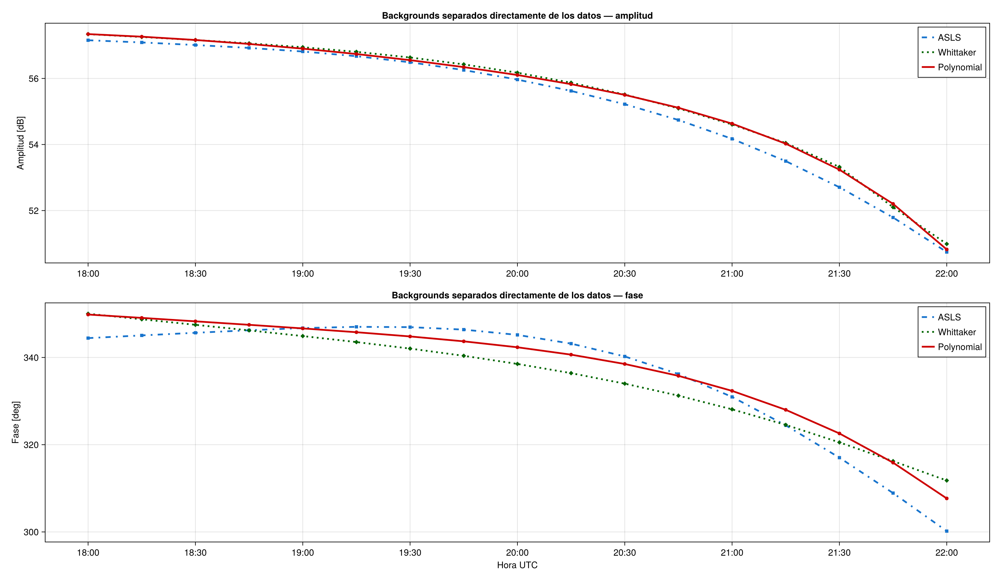

CairoMakie.Screen{IMAGE}


In [30]:
ticks_17 = collect(18.0:0.5:22.0)
tick_dt_17 = collect(
    DateTime(2008, 3, 25, 18, 0, 0):
    Minute(30):
    DateTime(2008, 3, 25, 22, 0, 0),
)

xticks_17 = (
    ticks_17,
    Dates.format.(tick_dt_17, "HH:MM"),
)

fig_separated_backgrounds = CM.Figure(size = (1550, 900))

axA_sep = CM.Axis(
    fig_separated_backgrounds[1, 1],
    title = "Backgrounds separados directamente de los datos — amplitud",
    ylabel = "Amplitud [dB]",
    xticks = xticks_17,
)

for i in eachindex(METHOD_NAMES)
    CM.lines!(
        axA_sep,
        t_hours_17,
        A_sep_17[i],
        color = METHOD_COLORS[i],
        linestyle = METHOD_LINESTYLES[i],
        linewidth = 2.7,
        label = METHOD_NAMES[i],
    )
    CM.scatter!(
        axA_sep,
        t_hours_17,
        A_sep_17[i],
        color = METHOD_COLORS[i],
        marker = METHOD_MARKERS[i],
        markersize = 8,
    )
end

CM.axislegend(axA_sep, position = :rt)

axPhi_sep = CM.Axis(
    fig_separated_backgrounds[2, 1],
    title = "Backgrounds separados directamente de los datos — fase",
    xlabel = "Hora UTC",
    ylabel = "Fase [deg]",
    xticks = xticks_17,
)

for i in eachindex(METHOD_NAMES)
    CM.lines!(
        axPhi_sep,
        t_hours_17,
        phi_sep_17[i],
        color = METHOD_COLORS[i],
        linestyle = METHOD_LINESTYLES[i],
        linewidth = 2.7,
        label = METHOD_NAMES[i],
    )
    CM.scatter!(
        axPhi_sep,
        t_hours_17,
        phi_sep_17[i],
        color = METHOD_COLORS[i],
        marker = METHOD_MARKERS[i],
        markersize = 8,
    )
end

CM.axislegend(axPhi_sep, position = :rt)
CM.linkxaxes!(axA_sep, axPhi_sep)
CM.xlims!(axA_sep, 18.0, 22.0)

CM.save(
    joinpath(FIGDIR, "backgrounds_separados_3familias_17pts.png"),
    fig_separated_backgrounds,
)

display(fig_separated_backgrounds)

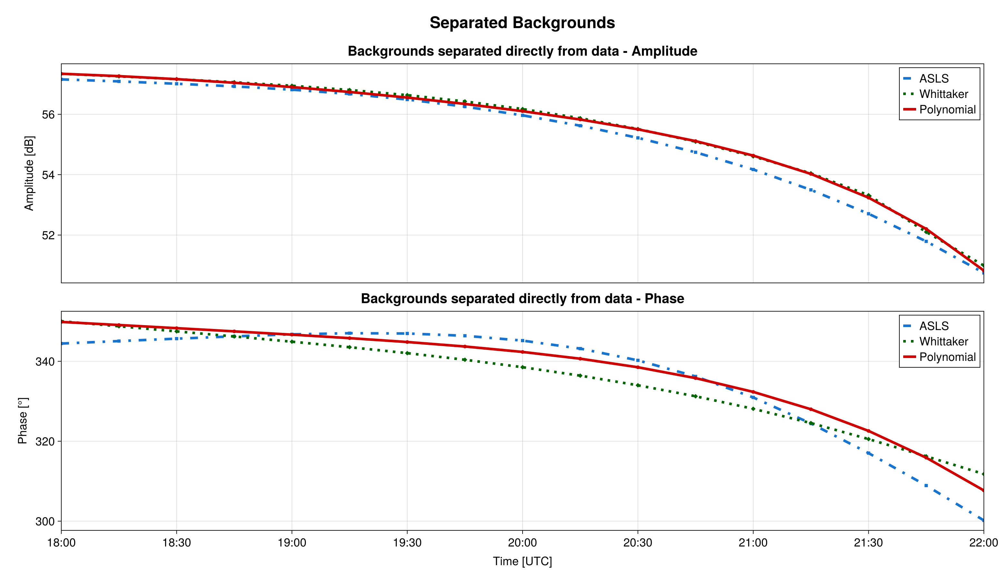

CairoMakie.Screen{IMAGE}


In [34]:
fontsize = 18
curve_linewidth = 4.0

xlim_separated = (18.0, 22.0)

ticks_17 = collect(18.0:0.5:22.0)
tick_dt_17 = collect(
    DateTime(2008, 3, 25, 18, 0, 0):
    Minute(30):
    DateTime(2008, 3, 25, 22, 0, 0),
)

xticks_17 = (
    ticks_17,
    Dates.format.(tick_dt_17, "HH:MM"),
)

fig_separated_backgrounds = CM.Figure(
    size = (1550, 900),
    figure_padding = (25, 25, 20, 20),
)

CM.Label(
    fig_separated_backgrounds[0, 1],
    "Separated Backgrounds",
    fontsize = fontsize + 7,
    font = :bold,
    tellwidth = false,
    padding = (0, 0, 5, 0),
)

axA_sep = CM.Axis(
    fig_separated_backgrounds[1, 1],
    title = "Backgrounds separated directly from data - Amplitude",
    ylabel = "Amplitude [dB]",
    xticks = xticks_17,
    limits = (xlim_separated, nothing),

    titlesize = fontsize + 3,
    titlefont = :bold,
    ylabelsize = fontsize,
    xticklabelsize = fontsize,
    yticklabelsize = fontsize,

    titlegap = 8,
    ylabelpadding = 10,

    xticksvisible = false,
    xticklabelsvisible = false,
)

for i in eachindex(METHOD_NAMES)
    CM.lines!(
        axA_sep,
        t_hours_17,
        A_sep_17[i],
        color = METHOD_COLORS[i],
        linestyle = METHOD_LINESTYLES[i],
        linewidth = curve_linewidth,
        label = METHOD_NAMES[i],
    )

    CM.scatter!(
        axA_sep,
        t_hours_17,
        A_sep_17[i],
        color = METHOD_COLORS[i],
        marker = METHOD_MARKERS[i],
        markersize = 8,
    )
end

CM.axislegend(
    axA_sep,
    position = :rt,
    labelsize = fontsize,
    framevisible = true,
)

axPhi_sep = CM.Axis(
    fig_separated_backgrounds[2, 1],
    title = "Backgrounds separated directly from data - Phase",
    xlabel = "Time [UTC]",
    ylabel = "Phase [°]",
    xticks = xticks_17,
    limits = (xlim_separated, nothing),

    titlesize = fontsize + 3,
    titlefont = :bold,
    xlabelsize = fontsize,
    ylabelsize = fontsize,
    xticklabelsize = fontsize,
    yticklabelsize = fontsize,

    titlegap = 8,
    xlabelpadding = 8,
    ylabelpadding = 10,
)

for i in eachindex(METHOD_NAMES)
    CM.lines!(
        axPhi_sep,
        t_hours_17,
        phi_sep_17[i],
        color = METHOD_COLORS[i],
        linestyle = METHOD_LINESTYLES[i],
        linewidth = curve_linewidth,
        label = METHOD_NAMES[i],
    )

    CM.scatter!(
        axPhi_sep,
        t_hours_17,
        phi_sep_17[i],
        color = METHOD_COLORS[i],
        marker = METHOD_MARKERS[i],
        markersize = 8,
    )
end

CM.axislegend(
    axPhi_sep,
    position = :rt,
    labelsize = fontsize,
    framevisible = true,
)

CM.linkxaxes!(axA_sep, axPhi_sep)

CM.xlims!(axA_sep, xlim_separated...)
CM.xlims!(axPhi_sep, xlim_separated...)

CM.rowgap!(fig_separated_backgrounds.layout, 12)

CM.save(
    joinpath(
        FIGDIR,
        "backgrounds_separados_3familias_17pts.pdf",
    ),
    fig_separated_backgrounds,
)

display(fig_separated_backgrounds)

In [35]:
FIGDIR

"/home/jp/basefolder_JP/comparacion_3familias_best2_perturbacion_y_backgrounds/figures"

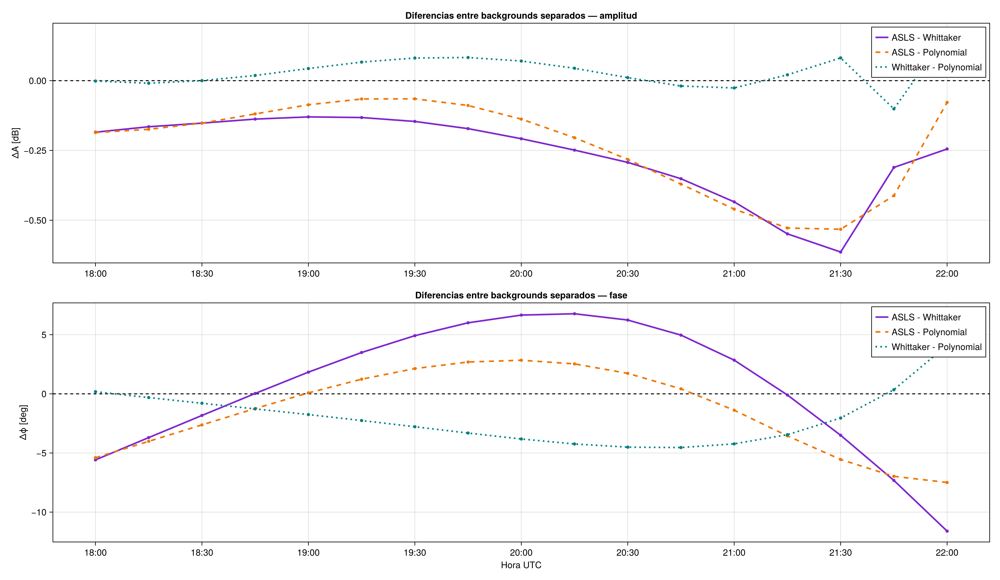

CairoMakie.Screen{IMAGE}


In [25]:
fig_separated_pairwise = CM.Figure(size = (1550, 900))

axDA_sep = CM.Axis(
    fig_separated_pairwise[1, 1],
    title = "Diferencias entre backgrounds separados — amplitud",
    ylabel = "ΔA [dB]",
    xticks = xticks_17,
)

CM.hlines!(axDA_sep, [0.0], color = :black, linestyle = :dash)

for k in eachindex(pair_indices)
    i, j = pair_indices[k]
    dA = A_sep_17[i] .- A_sep_17[j]

    CM.lines!(
        axDA_sep,
        t_hours_17,
        dA,
        color = PAIR_COLORS[k],
        linestyle = PAIR_LINESTYLES[k],
        linewidth = 2.5,
        label = pair_labels[k],
    )
    CM.scatter!(
        axDA_sep,
        t_hours_17,
        dA,
        color = PAIR_COLORS[k],
        markersize = 7,
    )
end

CM.axislegend(axDA_sep, position = :rt)

axDPhi_sep = CM.Axis(
    fig_separated_pairwise[2, 1],
    title = "Diferencias entre backgrounds separados — fase",
    xlabel = "Hora UTC",
    ylabel = "Δϕ [deg]",
    xticks = xticks_17,
)

CM.hlines!(axDPhi_sep, [0.0], color = :black, linestyle = :dash)

for k in eachindex(pair_indices)
    i, j = pair_indices[k]
    dphi = phi_sep_17[i] .- phi_sep_17[j]

    CM.lines!(
        axDPhi_sep,
        t_hours_17,
        dphi,
        color = PAIR_COLORS[k],
        linestyle = PAIR_LINESTYLES[k],
        linewidth = 2.5,
        label = pair_labels[k],
    )
    CM.scatter!(
        axDPhi_sep,
        t_hours_17,
        dphi,
        color = PAIR_COLORS[k],
        markersize = 7,
    )
end

CM.axislegend(axDPhi_sep, position = :rt)
CM.linkxaxes!(axDA_sep, axDPhi_sep)
CM.xlims!(axDA_sep, 18.0, 22.0)

CM.save(
    joinpath(FIGDIR, "backgrounds_separados_diferencias_pares_17pts.png"),
    fig_separated_pairwise,
)

display(fig_separated_pairwise)

## 7. Backgrounds físicos reconstruidos por las inversiones — 17 puntos

In [26]:
function load_model_background(
    label::AbstractString,
    background_h5::AbstractString,
    fallback_perturbation_h5::AbstractString;
    ref_time::NamedTuple,
)
    A_keys = [
        "reconstruction/A_model",
        "reconstruction/A_best",
        "reconstruction/best_A",
        "best/A_model",
        "best/A",
        "A_model",
        "A_best",
        "A_reco",
        "background/A_model",
        "background/A_background",
        "A_background",
        "A_bg_model",
        "A_background_model",
    ]

    phi_keys = [
        "reconstruction/phi_model",
        "reconstruction/phi_best",
        "reconstruction/best_phi",
        "best/phi_model",
        "best/phi",
        "phi_model",
        "phi_best",
        "phi_reco",
        "background/phi_model",
        "background/phi_background",
        "phi_background",
        "phi_bg_model",
        "phi_background_model",
    ]

    last_error = nothing

    for path in [background_h5, fallback_perturbation_h5]
        try
            A_raw, A_key = first_existing_vector(path, A_keys)
            phi_raw, phi_key = first_existing_vector(path, phi_keys)

            length(A_raw) == length(phi_raw) || error(
                "A y ϕ tienen longitudes distintas.",
            )

            fallback_unix =
                length(A_raw) == length(ref_time.hours) ? ref_time.unix : nothing

            source_time = time_reference(
                path,
                length(A_raw);
                fallback_ref_unix = fallback_unix,
            )

            A, _, max_dt_A, unit_A = align_to_reference(
                A_raw,
                source_time,
                ref_time,
            )

            phi, _, max_dt_phi, unit_phi = align_to_reference(
                phi_raw,
                source_time,
                ref_time,
            )

            return (
                label = label,
                path = path,
                A = A,
                phi = phi,
                A_key = A_key,
                phi_key = phi_key,
                time_source = source_time.source,
                max_delta_t = max(max_dt_A, max_dt_phi),
                time_unit = unit_A,
            )
        catch err
            last_error = err
        end
    end

    error(
        "No pude cargar el background modelado de $(label). " *
        "Último error: $(last_error)",
    )
end

model_old_17 = load_model_background(
    "old ASLS",
    OLD_BG_H5,
    OLD_SECOND_H5;
    ref_time = REF17,
)

model_whit_17 = load_model_background(
    "Whittaker",
    WHIT_BG_H5,
    WHIT_SECOND_H5;
    ref_time = REF17,
)

model_poly_17 = load_model_background(
    "PolyF3",
    POLY_BG_H5,
    POLY_SECOND_H5;
    ref_time = REF17,
)

model_backgrounds_17 = [
    model_old_17,
    model_whit_17,
    model_poly_17,
]

A_model_bg_17 = [x.A for x in model_backgrounds_17]
phi_model_bg_17 = [x.phi for x in model_backgrounds_17]

model_background_audit = DataFrame(
    metodo = METHOD_NAMES,
    archivo_usado = basename.([x.path for x in model_backgrounds_17]),
    A_key = [x.A_key for x in model_backgrounds_17],
    phi_key = [x.phi_key for x in model_backgrounds_17],
    fuente_tiempo = [x.time_source for x in model_backgrounds_17],
    max_delta_t = [x.max_delta_t for x in model_backgrounds_17],
    unidad_delta_t = [x.time_unit for x in model_backgrounds_17],
)

model_background_pairwise = pairwise_difference_table(
    METHOD_NAMES,
    A_model_bg_17,
    phi_model_bg_17,
)

println("Auditoría de backgrounds físicos reconstruidos:")
display(model_background_audit)

println("Diferencias por pares entre backgrounds físicos reconstruidos:")
display(model_background_pairwise)

write_dataframe_csv(
    model_background_audit,
    joinpath(TABDIR, "audit_backgrounds_modelados_17pts.csv"),
)

write_dataframe_csv(
    model_background_pairwise,
    joinpath(TABDIR, "diferencias_backgrounds_modelados_17pts.csv"),
)

Auditoría de backgrounds físicos reconstruidos:


Row,metodo,archivo_usado,A_key,phi_key,fuente_tiempo,max_delta_t,unidad_delta_t
,String,String,String,String,String,Float64,String
1,ASLS,new-real-background-inversion-bbo_from_old_asls_restart_results_13341497.h5,reconstruction/A_model,reconstruction/phi_model,time/timestamps_unix_used,0.0,s
2,Whittaker,new-real-background-inversion_from_sep_16_22_restart15_results_12976567.h5,reconstruction/A_model,reconstruction/phi_model,time/timestamps_unix_used,0.0,s
3,Polynomial,new-real-background-inversion_from_polyF3_simultaneous_restart_from_15706055_results_15742708.h5,reconstruction/A_model,reconstruction/phi_model,time/timestamps_unix_used,0.0,s


Diferencias por pares entre backgrounds físicos reconstruidos:


Row,comparacion,mean_delta_A_dB,rmse_delta_A_dB,maxabs_delta_A_dB,mean_delta_phi_deg,rmse_delta_phi_deg,maxabs_delta_phi_deg
,String,Float64,Float64,Float64,Float64,Float64,Float64
1,ASLS - Whittaker,0.446504,0.585732,0.753873,-5.53274,6.99842,14.8778
2,ASLS - Polynomial,-0.124871,0.298403,0.871317,-10.3116,11.2372,22.0977
3,Whittaker - Polynomial,-0.571375,0.582134,0.698855,-4.77884,4.84014,7.2199


Tabla guardada: /home/jp/basefolder_JP/comparacion_3familias_best2_perturbacion_y_backgrounds/tables/audit_backgrounds_modelados_17pts.csv
Tabla guardada: /home/jp/basefolder_JP/comparacion_3familias_best2_perturbacion_y_backgrounds/tables/diferencias_backgrounds_modelados_17pts.csv


"/home/jp/basefolder_JP/comparacion_3familias_best2_perturbacion_y_backgrounds/tables/diferencias_backgrounds_modelados_17pts.csv"

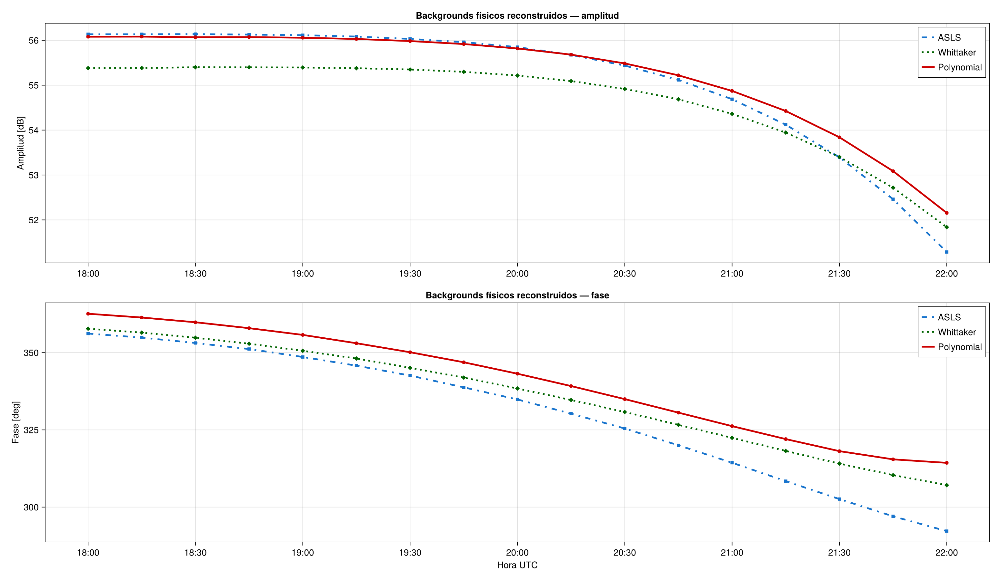

CairoMakie.Screen{IMAGE}


In [27]:
fig_model_backgrounds = CM.Figure(size = (1550, 900))

axA_model_bg = CM.Axis(
    fig_model_backgrounds[1, 1],
    title = "Backgrounds físicos reconstruidos — amplitud",
    ylabel = "Amplitud [dB]",
    xticks = xticks_17,
)

for i in eachindex(METHOD_NAMES)
    CM.lines!(
        axA_model_bg,
        t_hours_17,
        A_model_bg_17[i],
        color = METHOD_COLORS[i],
        linestyle = METHOD_LINESTYLES[i],
        linewidth = 2.7,
        label = METHOD_NAMES[i],
    )
    CM.scatter!(
        axA_model_bg,
        t_hours_17,
        A_model_bg_17[i],
        color = METHOD_COLORS[i],
        marker = METHOD_MARKERS[i],
        markersize = 8,
    )
end

CM.axislegend(axA_model_bg, position = :rt)

axPhi_model_bg = CM.Axis(
    fig_model_backgrounds[2, 1],
    title = "Backgrounds físicos reconstruidos — fase",
    xlabel = "Hora UTC",
    ylabel = "Fase [deg]",
    xticks = xticks_17,
)

for i in eachindex(METHOD_NAMES)
    CM.lines!(
        axPhi_model_bg,
        t_hours_17,
        phi_model_bg_17[i],
        color = METHOD_COLORS[i],
        linestyle = METHOD_LINESTYLES[i],
        linewidth = 2.7,
        label = METHOD_NAMES[i],
    )
    CM.scatter!(
        axPhi_model_bg,
        t_hours_17,
        phi_model_bg_17[i],
        color = METHOD_COLORS[i],
        marker = METHOD_MARKERS[i],
        markersize = 8,
    )
end

CM.axislegend(axPhi_model_bg, position = :rt)
CM.linkxaxes!(axA_model_bg, axPhi_model_bg)
CM.xlims!(axA_model_bg, 18.0, 22.0)

CM.save(
    joinpath(FIGDIR, "backgrounds_modelados_3familias_17pts.png"),
    fig_model_backgrounds,
)

display(fig_model_backgrounds)

### Next plot: "reconstructed_backgrounds_3families_17pts.pdf" (Figure 8)

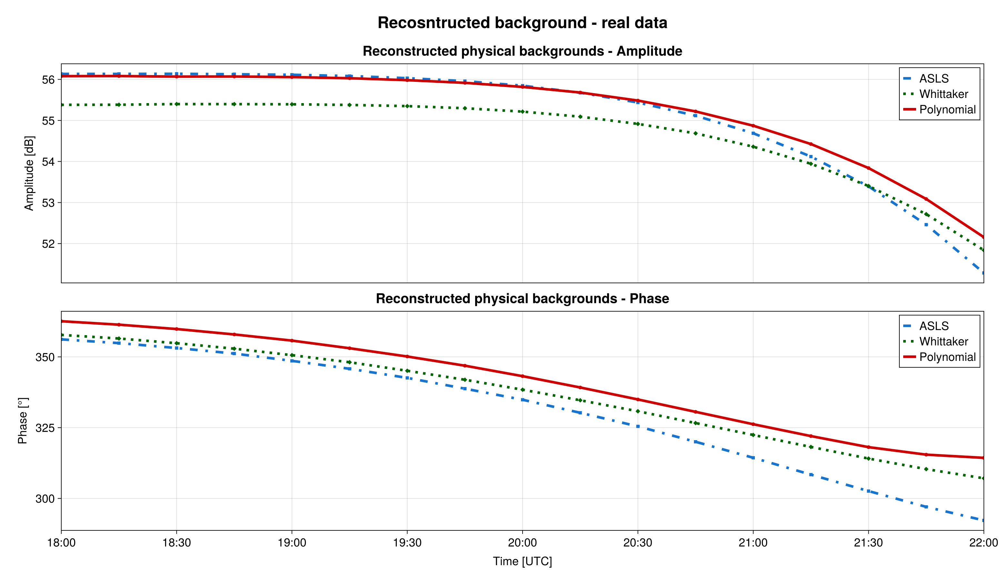

CairoMakie.Screen{IMAGE}


In [38]:
fontsize = 18
curve_linewidth = 4.0

xlim_model_bg = (18.0, 22.0)

fig_model_backgrounds = CM.Figure(
    size = (1550, 900),
    figure_padding = (25, 25, 20, 20),
)

CM.Label(
    fig_model_backgrounds[0, 1],
    "Recosntructed background - real data",
    fontsize = fontsize + 7,
    font = :bold,
    tellwidth = false,
    padding = (0, 0, 5, 0),
)

axA_model_bg = CM.Axis(
    fig_model_backgrounds[1, 1],
    title = "Reconstructed physical backgrounds - Amplitude",
    ylabel = "Amplitude [dB]",
    xticks = xticks_17,
    limits = (xlim_model_bg, nothing),

    titlesize = fontsize + 3,
    titlefont = :bold,
    ylabelsize = fontsize,
    xticklabelsize = fontsize,
    yticklabelsize = fontsize,

    titlegap = 8,
    ylabelpadding = 10,

    xticksvisible = false,
    xticklabelsvisible = false,
)

for i in eachindex(METHOD_NAMES)
    CM.lines!(
        axA_model_bg,
        t_hours_17,
        A_model_bg_17[i],
        color = METHOD_COLORS[i],
        linestyle = METHOD_LINESTYLES[i],
        linewidth = curve_linewidth,
        label = METHOD_NAMES[i],
    )
    CM.scatter!(
        axA_model_bg,
        t_hours_17,
        A_model_bg_17[i],
        color = METHOD_COLORS[i],
        marker = METHOD_MARKERS[i],
        markersize = 8,
    )
end

CM.axislegend(
    axA_model_bg,
    position = :rt,
    labelsize = fontsize,
    framevisible = true,
)

axPhi_model_bg = CM.Axis(
    fig_model_backgrounds[2, 1],
    title = "Reconstructed physical backgrounds - Phase",
    xlabel = "Time [UTC]",
    ylabel = "Phase [°]",
    xticks = xticks_17,
    limits = (xlim_model_bg, nothing),

    titlesize = fontsize + 3,
    titlefont = :bold,
    xlabelsize = fontsize,
    ylabelsize = fontsize,
    xticklabelsize = fontsize,
    yticklabelsize = fontsize,

    titlegap = 8,
    xlabelpadding = 8,
    ylabelpadding = 10,
)

for i in eachindex(METHOD_NAMES)
    CM.lines!(
        axPhi_model_bg,
        t_hours_17,
        phi_model_bg_17[i],
        color = METHOD_COLORS[i],
        linestyle = METHOD_LINESTYLES[i],
        linewidth = curve_linewidth,
        label = METHOD_NAMES[i],
    )
    CM.scatter!(
        axPhi_model_bg,
        t_hours_17,
        phi_model_bg_17[i],
        color = METHOD_COLORS[i],
        marker = METHOD_MARKERS[i],
        markersize = 8,
    )
end

CM.axislegend(
    axPhi_model_bg,
    position = :rt,
    labelsize = fontsize,
    framevisible = true,
)

CM.linkxaxes!(axA_model_bg, axPhi_model_bg)

CM.xlims!(axA_model_bg, xlim_model_bg...)
CM.xlims!(axPhi_model_bg, xlim_model_bg...)

CM.rowgap!(fig_model_backgrounds.layout, 12)

CM.save(
    joinpath(FIGDIR, "backgrounds_modelados_3familias_17pts.pdf"),
    fig_model_backgrounds,
)

display(fig_model_backgrounds)

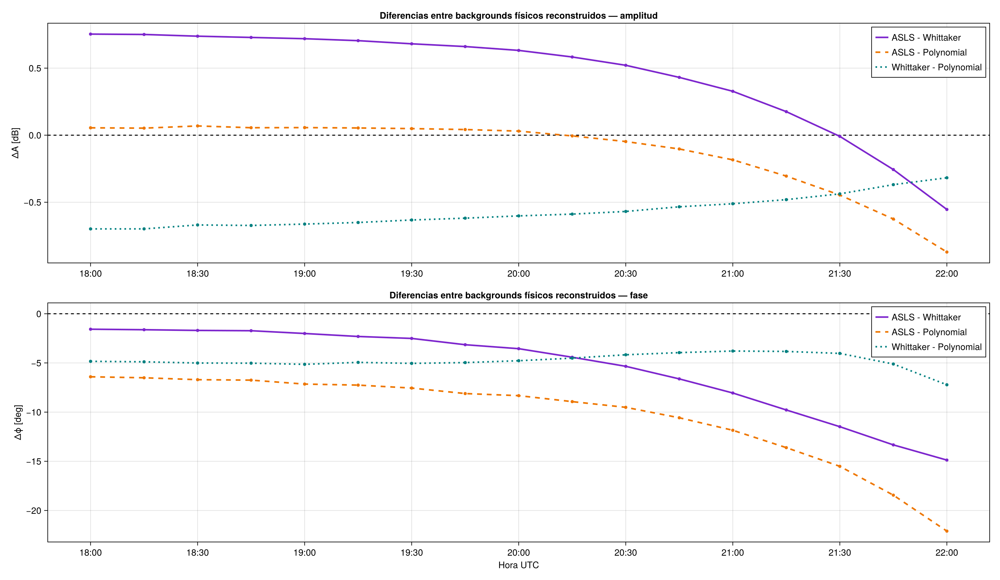

CairoMakie.Screen{IMAGE}


In [28]:
fig_model_pairwise = CM.Figure(size = (1550, 900))

axDA_model = CM.Axis(
    fig_model_pairwise[1, 1],
    title = "Diferencias entre backgrounds físicos reconstruidos — amplitud",
    ylabel = "ΔA [dB]",
    xticks = xticks_17,
)

CM.hlines!(axDA_model, [0.0], color = :black, linestyle = :dash)

for k in eachindex(pair_indices)
    i, j = pair_indices[k]
    dA = A_model_bg_17[i] .- A_model_bg_17[j]

    CM.lines!(
        axDA_model,
        t_hours_17,
        dA,
        color = PAIR_COLORS[k],
        linestyle = PAIR_LINESTYLES[k],
        linewidth = 2.5,
        label = pair_labels[k],
    )
    CM.scatter!(
        axDA_model,
        t_hours_17,
        dA,
        color = PAIR_COLORS[k],
        markersize = 7,
    )
end

CM.axislegend(axDA_model, position = :rt)

axDPhi_model = CM.Axis(
    fig_model_pairwise[2, 1],
    title = "Diferencias entre backgrounds físicos reconstruidos — fase",
    xlabel = "Hora UTC",
    ylabel = "Δϕ [deg]",
    xticks = xticks_17,
)

CM.hlines!(axDPhi_model, [0.0], color = :black, linestyle = :dash)

for k in eachindex(pair_indices)
    i, j = pair_indices[k]
    dphi = phi_model_bg_17[i] .- phi_model_bg_17[j]

    CM.lines!(
        axDPhi_model,
        t_hours_17,
        dphi,
        color = PAIR_COLORS[k],
        linestyle = PAIR_LINESTYLES[k],
        linewidth = 2.5,
        label = pair_labels[k],
    )
    CM.scatter!(
        axDPhi_model,
        t_hours_17,
        dphi,
        color = PAIR_COLORS[k],
        markersize = 7,
    )
end

CM.axislegend(axDPhi_model, position = :rt)
CM.linkxaxes!(axDA_model, axDPhi_model)
CM.xlims!(axDA_model, 18.0, 22.0)

CM.save(
    joinpath(FIGDIR, "backgrounds_modelados_diferencias_pares_17pts.png"),
    fig_model_pairwise,
)

display(fig_model_pairwise)

## 8. Resumen cuantitativo

In [15]:
ranking_chi2_total = sort(
    select(
        metrics_perturbation_5min,
        :metodo,
        :chi2_A,
        :chi2_phi,
        :chi2_total,
        :RMSE_A_dB,
        :RMSE_phi_deg,
    ),
    :chi2_total,
)

println("Ranking de las reconstrucciones best 2da por χ²_total:")
display(ranking_chi2_total)

println("\nArchivos producidos:")
println("  figuras: ", FIGDIR)
println("  tablas:  ", TABDIR)

println("\nNo se ejecutó ninguna evaluación forward.")

Ranking de las reconstrucciones best 2da por χ²_total:


Row,metodo,chi2_A,chi2_phi,chi2_total,RMSE_A_dB,RMSE_phi_deg
,String,Float64,Float64,Float64,Float64,Float64
1,PolyF3 — best 2da,0.0972514,0.0889919,0.186243,0.737906,10.6146
2,Whittaker — best 2da,0.167012,0.114903,0.281915,0.967001,12.0613
3,old ASLS — best 2da,0.0692188,0.236312,0.30553,0.622537,17.297



Archivos producidos:
  figuras: /home/jp/basefolder_JP/comparacion_3familias_best2_perturbacion_y_backgrounds/figures
  tablas:  /home/jp/basefolder_JP/comparacion_3familias_best2_perturbacion_y_backgrounds/tables

No se ejecutó ninguna evaluación forward.
